<a href="https://colab.research.google.com/github/Singha2093/Enhancing-Safety-Through-Advanced-Obstacle-Tracking-and-Detection-for-Self--Driving-Vehicles/blob/main/Yolov8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np
import json
import os
import glob
import shutil
import random
import matplotlib.pyplot as plt
import tensorflow as tf
import torch
import yaml
from collections import defaultdict
from sklearn.model_selection import train_test_split
from PIL import Image

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Download the dataset
!curl -L "https://public.roboflow.com/ds/MAy1KWFA2r?key=PL1uJFNkEu" > roboflow.zip

# Unzip the downloaded dataset
!unzip roboflow.zip

Streaming output truncated to the last 5000 lines.
 extracting: export/labels/1478900109306048491_jpg.rf.7f8266ddc28a351f0dcd20604c268259.txt  
 extracting: export/labels/1478900109306048491_jpg.rf.y4x0eVX2sO7ecR0TUaVr.txt  
 extracting: export/labels/1478900109878689818_jpg.rf.VDdJVseJIvOB61vpFirp.txt  
 extracting: export/labels/1478900109878689818_jpg.rf.bcebbb0d35bd86bda671f535b3f64031.txt  
 extracting: export/labels/1478900110449179205_jpg.rf.996b317597119cdcc563966e7c02b624.txt  
 extracting: export/labels/1478900110449179205_jpg.rf.BeHDkSoCfqcbL7l2e86o.txt  
 extracting: export/labels/1478900111020889294_jpg.rf.dac0676c053b218573c57367055fe8b2.txt  
 extracting: export/labels/1478900111020889294_jpg.rf.uUaiVa1Rn8K5eJTu2pvC.txt  
 extracting: export/labels/1478900111592085926_jpg.rf.58ddab1db87104355311ee1696d35449.txt  
 extracting: export/labels/1478900111592085926_jpg.rf.nA12WQhyH7O7E7ggQ4nn.txt  
 extracting: export/labels/1478900112162597702_jpg.rf.0fcefae4646f6879fce730488

In [4]:
def check_empty_labels(label_dir):
    """
    Check for empty labels in the dataset.

    Args:
    - label_dir (str): Path to the directory containing label files.

    Returns:
    - empty_labels (list): List of filenames with empty labels.
    """
    empty_labels = []

    # Iterate through label files in the directory
    for filename in os.listdir(label_dir):
        if filename.endswith('.txt'):
            label_file = os.path.join(label_dir, filename)
            # Check if label file is empty
            with open(label_file, 'r') as f:
                lines = f.readlines()
                if not lines:
                    empty_labels.append(filename)

    return empty_labels

# Example usage:
label_dir = '/content/export/labels'
empty_labels = check_empty_labels(label_dir)

if empty_labels:
    print("Files with empty labels:")
    for filename in empty_labels:
        print(filename)
else:
    print("No empty labels found.")

Files with empty labels:
1478897684181474384_jpg.rf.eeaae8eb059615c428c356073748c292.txt
1478898793055057128_jpg.rf.dLRUhuOTxtDyGNlPuFTi.txt
1478897687609768360_jpg.rf.LEMelCLcXAegh1mSTnYl.txt
1478895512711106232_jpg.rf.AsK1Usn6gNrrd9DkNnjY.txt
1478900676026204617_jpg.rf.0e9ede3b0ca620c86d7377acdbc4f5d1.txt
1478896288520829218_jpg.rf.YVJgfCmHXorzM9Wl5BoX.txt
1478895455580929694_jpg.rf.illbvV4xzBN92NmXlIUE.txt
1478895911469911245_jpg.rf.CTSEh1lNgvxTK8vctLPh.txt
1478896017158062829_jpg.rf.a2e9e482f81fa6129a5baadfa53434a9.txt
1478895980595394574_jpg.rf.gyWNunnTgSbK5shBSAZG.txt
1478898851898470326_jpg.rf.lTv3vQSNY0LCNo0IZuy2.txt
1478895833774036594_jpg.rf.32a96c6b0dd3c88d17fff54c037ac3c7.txt
1478895458436735690_jpg.rf.2d1ff8cd5811e690d177b2dd2860c074.txt
1478896005733121073_jpg.rf.5e26e7c72d015422b319cb9b9c12ddc6.txt
1478021669576963429_jpg.rf.3de2575a493a07f0a1be936ff897a7bb.txt
1478895435014327397_jpg.rf.Me2jaMN4PZrYWuk5aGUZ.txt
1478895645820477408_jpg.rf.6335fd2830bc3361894c23a469ea5a83

In [5]:
def delete_empty_labels_and_images(label_dir, image_dir):
    """
    Delete empty label files and their corresponding image files.

    Args:
    - label_dir (str): Path to the directory containing label files.
    - image_dir (str): Path to the directory containing image files.
    """
    empty_labels_count = 0
    deleted_images_count = 0

    # Iterate through label files in the directory
    for filename in os.listdir(label_dir):
        if filename.endswith('.txt'):
            label_file = os.path.join(label_dir, filename)
            # Check if label file is empty
            with open(label_file, 'r') as f:
                if not f.read().strip():
                    # Delete the empty label file
                    os.remove(label_file)
                    empty_labels_count += 1

                    # Construct the corresponding image file path
                    # Assuming the image extension can be .jpg, .png, etc.
                    # You might need to adjust the logic here if your dataset uses different or multiple image formats
                    image_filename = filename.rsplit('.', 1)[0] + '.jpg'  # Change '.jpg' to your image extension
                    image_file = os.path.join(image_dir, image_filename)

                    # Delete the corresponding image file if it exists
                    if os.path.exists(image_file):
                        os.remove(image_file)
                        deleted_images_count += 1

    return empty_labels_count, deleted_images_count

# Example usage:
label_dir = '/content/export/labels'
image_dir = '/content/export/images'
empty_labels_count, deleted_images_count = delete_empty_labels_and_images(label_dir, image_dir)

print(f"Deleted {empty_labels_count} empty label files and {deleted_images_count} corresponding image files.")


Deleted 3522 empty label files and 3522 corresponding image files.


In [6]:
# Define your directories
label_dir = '/content/export/labels'
image_dir = '/content/export/images'

# Function to count files
def count_files(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

# Counting
num_images = count_files(image_dir)
num_labels = count_files(label_dir)

# Printing the counts
print(f"Total number of images: {num_images}")
print(f"Total number of label files: {num_labels}")


Total number of images: 26478
Total number of label files: 26478


In [7]:
def create_datasets(base_dir, images_dir_name='images', labels_dir_name='labels', split_ratios=(0.6, 0.2, 0.2)):
    assert sum(split_ratios) == 1.0, "Split ratios must sum to 1"

    images_path = os.path.join(base_dir, images_dir_name)
    labels_path = os.path.join(base_dir, labels_dir_name)

    images = [img for img in os.listdir(images_path) if img.endswith('.jpg') or img.endswith('.png')]
    labels = [label for label in os.listdir(labels_path) if label.endswith('.txt')]

    # Ensure the lists are sorted so they're aligned
    images.sort()
    labels.sort()

    # Split data
    train_imgs, test_imgs, train_labels, test_labels = train_test_split(images, labels, test_size=split_ratios[1] + split_ratios[2], random_state=42)
    val_imgs, test_imgs, val_labels, test_labels = train_test_split(test_imgs, test_labels, test_size=split_ratios[2] / (split_ratios[1] + split_ratios[2]), random_state=42)

    # Function to create dirs and move files
    def move_files(files, src_dir, dest_dir):
        os.makedirs(dest_dir, exist_ok=True)
        for file in files:
            shutil.move(os.path.join(src_dir, file), os.path.join(dest_dir, file))

    # Create and populate directories
    for dtype, imgs, lbls in zip(['train', 'val', 'test'], [train_imgs, val_imgs, test_imgs], [train_labels, val_labels, test_labels]):
        move_files(imgs, images_path, os.path.join(base_dir, dtype, 'images'))
        move_files(lbls, labels_path, os.path.join(base_dir, dtype, 'labels'))

    return base_dir

# Usage example
base_dir = '/content/export'  #  dataset path
destination_folder = '/content/Data'  # Path to destination folder

base_dir = create_datasets(base_dir)



In [8]:
def count_files(directory):
    """
    Count the number of images and label files in the given directory.
    Assumes subdirectories named 'images' and 'labels' for storing respective files.
    """
    images_count = len([name for name in os.listdir(os.path.join(directory, 'images')) if name.endswith(('.png', '.jpg', '.jpeg'))])
    labels_count = len([name for name in os.listdir(os.path.join(directory, 'labels')) if name.endswith('.txt')])
    return images_count, labels_count

def display_dataset_distribution(base_dir):
    """
    Display the number of images and labels in training, validation, and test directories.
    """
    for dtype in ['train', 'val', 'test']:
        dir_path = os.path.join(base_dir, dtype)
        if os.path.exists(dir_path):
            images_count, labels_count = count_files(dir_path)
            print(f"{dtype.upper()} - Images: {images_count}, Labels: {labels_count}")
        else:
            print(f"{dtype.upper()} directory does not exist at {dir_path}")

# Example usage
base_dir = '/content/export/'  #  path to dataset directory
display_dataset_distribution(base_dir)


TRAIN - Images: 15886, Labels: 15886
VAL - Images: 5296, Labels: 5296
TEST - Images: 5296, Labels: 5296


In [9]:
def display_annotation(file_path, classes):
    """
    Displays the contents of a YOLO annotation file in a more human-readable way.

    Parameters:
    - file_path: The path to the annotation file.
    - classes: A list of class names corresponding to class IDs.
    """
    try:
        with open(file_path, 'r') as file:
            lines = file.readlines()
            if not lines:
                print("No annotations found in the file.")
                return

            print(f"Annotations for '{file_path}':")
            for line in lines:
                class_id, x_center, y_center, width, height = line.strip().split()
                class_name = classes[int(class_id)]
                print(f"Class: {class_name}, Center: ({x_center}, {y_center}), Width: {width}, Height: {height}")
    except FileNotFoundError:
        print(f"The file '{file_path}' does not exist.")
    except Exception as e:
        print(f"An error occurred: {e}")

# Example usage
classes = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']  # Example class names, adjust according to your dataset
annotation_file_path = "/content/export/test/labels/1478019957180061202_jpg.rf.b300a681fb0894be54fe7d8a09b06a10.txt"  # Update this path to your actual annotation file path

display_annotation(annotation_file_path, classes)


Annotations for '/content/export/test/labels/1478019957180061202_jpg.rf.b300a681fb0894be54fe7d8a09b06a10.txt':
Class: car, Center: (0.43255208333333334, 0.49666666666666665), Width: 0.015104166666666667, Height: 0.015
Class: car, Center: (0.4114583333333333, 0.49625), Width: 0.01875, Height: 0.010833333333333334
Class: car, Center: (0.3953125, 0.4975), Width: 0.008333333333333333, Height: 0.011666666666666667
Class: car, Center: (0.36484375, 0.49875), Width: 0.0109375, Height: 0.014166666666666666
Class: pedestrian, Center: (0.14088541666666668, 0.5054166666666666), Width: 0.0109375, Height: 0.035833333333333335
Class: car, Center: (0.23541666666666666, 0.5141666666666667), Width: 0.06666666666666667, Height: 0.085
Class: truck, Center: (0.290625, 0.495), Width: 0.04375, Height: 0.07666666666666666
Class: car, Center: (0.38177083333333334, 0.49833333333333335), Width: 0.021875, Height: 0.03333333333333333
Class: car, Center: (0.8578125, 0.4716666666666667), Width: 0.040625, Height: 0.0

In [10]:
class_names = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [11]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [12]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin

        class_name = class_names[int(labels[box_num])]

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        )

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name,
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image,
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image,
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [13]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()

    num_images = len(all_training_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0, num_images - 1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:].split()  # Split by whitespace
                x_c, y_c, w, h = map(float, bbox_string)  # Convert to float
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()


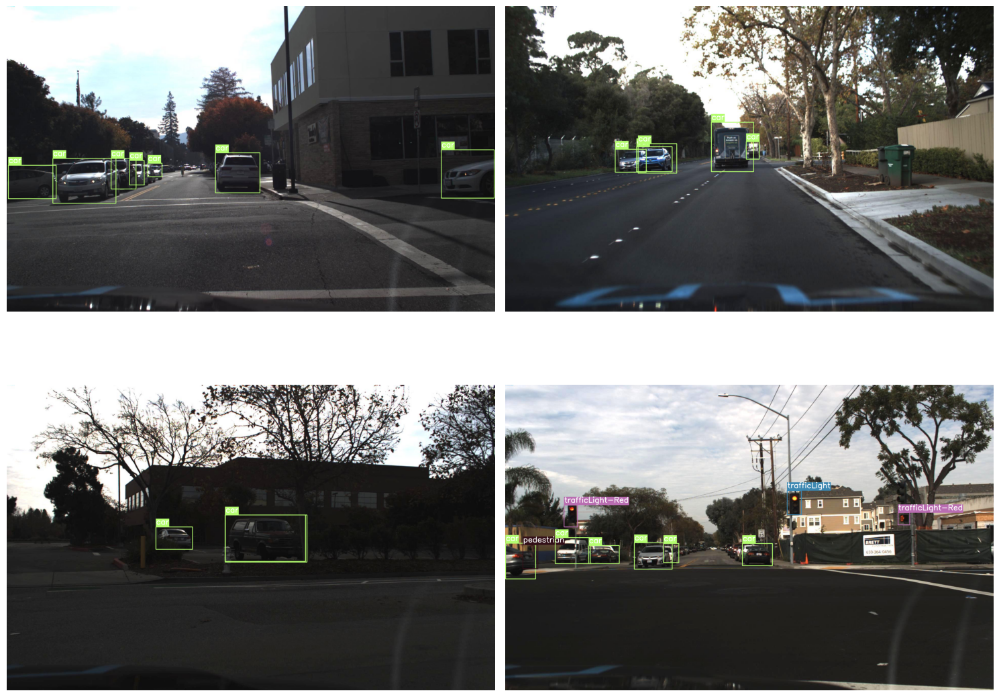

In [14]:
# Visualize a few training images.
plot(
    image_paths='/content/export/train/images/*',
    label_paths='/content/export/train/labels/*',
    num_samples=4,
)

In [15]:
import yaml

def create_data_yaml(train_path, val_path, test_path, names, is_coco=False, output_yaml_path='data.yaml'):
    """
    Create a YAML file for the dataset.

    Args:
    - train_path (str): Path to the training dataset.
    - val_path (str): Path to the validation dataset.
    - test_path (str): Path to the test dataset.
    - names (list): List of class names.
    - output_yaml_path (str, optional): Path to save the output YAML file. Defaults to 'data.yaml'.
    """
    nc = len(names)  # Number of classes

    data = {
        'train': train_path,
        'val': val_path,
        'test': test_path,
        'nc': nc,
        'names': names,
    }

    with open(output_yaml_path, 'w') as yaml_file:
        yaml.dump(data, yaml_file, sort_keys=False)

# Define paths and class names
train_path = '/content/export/train/images'
val_path = '/content/export/val/images'
test_path = '/content/export/test/images'
class_names = ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

# Create data.yaml, setting is_coco to False
create_data_yaml(train_path, val_path, test_path, class_names, is_coco=False)


In [16]:
# Define the dataset path and the data.yaml file name
dataset_path = '/content'
data_yaml = 'data.yaml'

# Construct the full path to the data.yaml file
data_yaml_path = os.path.join(dataset_path, data_yaml)

# Read the contents of the data.yaml file
with open(data_yaml_path, "r") as f:
    data_yaml_contents = f.read()

# Print the contents of the data.yaml file
print("Contents of data.yaml:")
print(data_yaml_contents)


Contents of data.yaml:
train: /content/export/train/images
val: /content/export/val/images
test: /content/export/test/images
nc: 11
names:
- biker
- car
- pedestrian
- trafficLight
- trafficLight-Green
- trafficLight-GreenLeft
- trafficLight-Red
- trafficLight-RedLeft
- trafficLight-Yellow
- trafficLight-YellowLeft
- truck



In [17]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/YOLO/Results/YOLOV8/

<IPython.core.display.Javascript object>

In [18]:
# Pip install method (recommended)

!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 40.5/201.2 GB disk)


In [19]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolov8s.pt")  # load a pretrained model (recommended for training)
model = YOLO("yolov8m.pt")

100%|██████████| 21.5M/21.5M [00:00<00:00, 98.6MB/s]


100%|██████████| 49.7M/49.7M [00:00<00:00, 143MB/s]


#YOLOV8s

In [ ]:
!yolo task=detect mode=train model=yolov8s.pt imgsz=640 data=/content/data.yaml epochs=50 batch=16  project=/content/drive/MyDrive/YOLO/Results/YOLOV8

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/YOLO/Results/YOLOV8, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labe

In [ ]:
import shutil

# Define source directory
source_dir = "/content/Test/MyDrive/YOLO/Results/YOLOV8/train"

# Define destination directory in Google Drive
destination_dir = "/content/drive/MyDrive/YOLO/Results/YOLOV8/train"

# Copy directory and its contents from Colab to Google Drive
shutil.copytree(source_dir, destination_dir)


'/content/drive/MyDrive/YOLO/Results/YOLOV8/train'

In [20]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/YOLO/Results/YOLOV8/train/weights/best.pt source=/content/export/test/images show=True imgsz=649

Streaming output truncated to the last 5000 lines.
image 300/5296 /content/export/test/images/1478020565206710542_jpg.rf.K0ADlwfbN99lZ0HgQspH.jpg: 448x672 2 cars, 1 trafficLight-Green, 13.7ms
image 301/5296 /content/export/test/images/1478020565206710542_jpg.rf.ac7397c3ee6cdda5a8df60425d35f1a8.jpg: 448x672 2 cars, 1 trafficLight-Green, 11.9ms
image 302/5296 /content/export/test/images/1478020566200177287_jpg.rf.bfb4b4a9469498ba53e177f2122de7ba.jpg: 448x672 2 cars, 1 trafficLight-Green, 13.7ms
image 303/5296 /content/export/test/images/1478020566708819281_jpg.rf.8922eb440b418c04b078bc0ee35479c0.jpg: 448x672 2 cars, 1 trafficLight-Green, 13.9ms
image 304/5296 /content/export/test/images/1478020567200885022_jpg.rf.b28985f111baffffa87b25563a0771f5.jpg: 448x672 2 cars, 1 trafficLight-Green, 14.8ms
image 305/5296 /content/export/test/images/1478020567200885022_jpg.rf.twXWyihn0LvDwLqeJd9S.jpg: 448x672 2 cars, 1 trafficLight-Green, 8.0ms
image 306/5296 /content/export/test/images/1478020568709

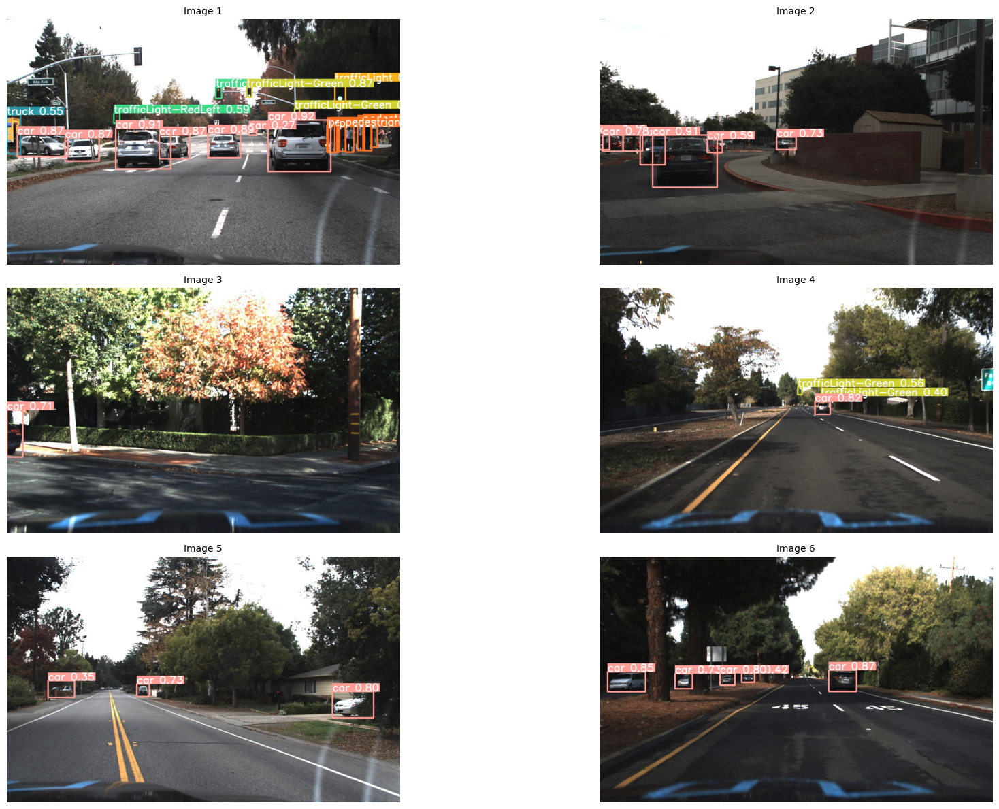

In [24]:
import glob
from PIL import Image
import matplotlib.pyplot as plt

# Parameters
image_paths = glob.glob('/content/runs/detect/predict/*.jpg')
n_images = len(image_paths)
limit = 6  # Max images to display
columns = 2  # Number of columns in the grid

# Check if there are images to display
if n_images == 0:
    print("No images found matching the specified pattern.")
else:
    # Calculate the number of rows needed, considering the limit
    rows = max(1, min(limit, n_images) // columns + (1 if min(limit, n_images) % columns else 0))

    # Create a figure with subplots
    fig, axs = plt.subplots(rows, columns, figsize=(20, rows * 4))
    fig.subplots_adjust(hspace=0.1)

    # Flatten the array of axes for easy iterating
    axs = axs.flatten()

    # Loop through the images and display them
    for i, image_path in enumerate(image_paths):
        if i >= limit:  # Stop after displaying the limit
            break
        img = Image.open(image_path)
        axs[i].imshow(img)
        axs[i].axis('off')  # Hide the axes ticks
        axs[i].set_title(f"Image {i+1}", fontsize=10)

    # Hide any remaining axes without images
    for j in range(i + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()



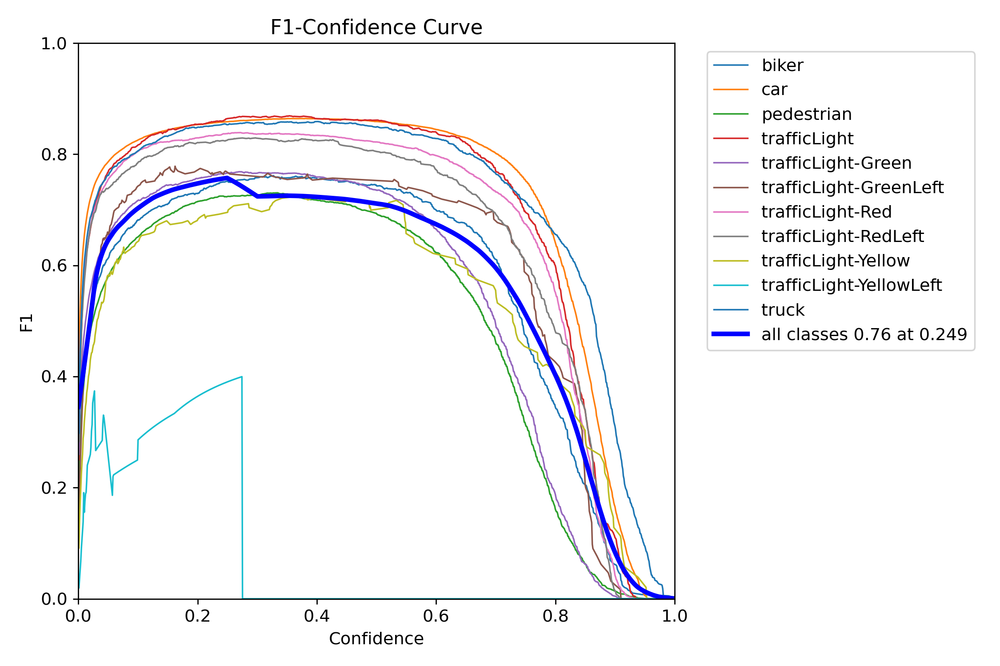

In [25]:
from IPython.display import Image, display

filename = '/content/drive/MyDrive/YOLO/Results/YOLOV8/train/F1_curve.png'  # Ensure the filename is correct
display(Image(filename=filename, width=600))